## DownLoading The Data

In [1]:
import os
import urllib.request
import zipfile

# Set the URL for the dataset zip file
url = 'https://github.com/spMohanty/PlantVillage-Dataset/archive/master.zip'

# Set the directory to download and extract the zip file
data_dir = '/content/dataset'

# Create the directory if it does not exist
if not os.path.exists(data_dir):
    os.makedirs(data_dir)

# Download the zip file from GitHub
print("Downloading dataset...")
zip_path, _ = urllib.request.urlretrieve(url)

# Extract the zip file to the data directory
print("Extracting dataset...")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(data_dir)

# Set the path to the extracted dataset directory
dataset_dir = os.path.join(data_dir, 'PlantVillage-Dataset-master')

# Print the list of directories in the dataset directory
print("Dataset directories:")
for dir_name in os.listdir(dataset_dir):
    if os.path.isdir(os.path.join(dataset_dir, dir_name)):
        print("- " + dir_name)

Extracting dataset...
Dataset directories:
- leaf_grouping
- data_distribution_for_SVM
- generated_for_paper
- utils
- raw


## Loading and Pre Processing the Data

In [2]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

tf.__version__

'2.12.0'

In [3]:
## Defining batch specfications
batch_size = 32
img_height = 256    
img_width = 256
IMG_SIZE = (224, 224)

In [4]:
!pip install split-folders
import splitfolders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:

input_folder = "/content/dataset/PlantVillage-Dataset-master/raw/color"
output_folder = "/content/dataset/PlantVillage-Dataset-master/split_data"
splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(0.8, 0.1, 0.1))



Copying files: 54305 files [00:10, 5144.08 files/s]


In [6]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=os.path.join(output_folder, "train"),
    batch_size=batch_size,
    color_mode="rgb",
    image_size=(img_height, img_width),
    shuffle=True,
    seed=42,
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=os.path.join(output_folder, "val"),
    batch_size=batch_size,
    color_mode="rgb",
    image_size=(img_height, img_width),
    shuffle=True,
    seed=42,
)

test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=os.path.join(output_folder, "test"),
    batch_size=batch_size,
    color_mode="rgb",
    image_size=(img_height, img_width),
    shuffle=False,
    seed=42,
)


Found 43429 files belonging to 38 classes.
Found 5417 files belonging to 38 classes.
Found 5459 files belonging to 38 classes.


In [7]:
class_names = train_ds.class_names
print(class_names)

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Sp

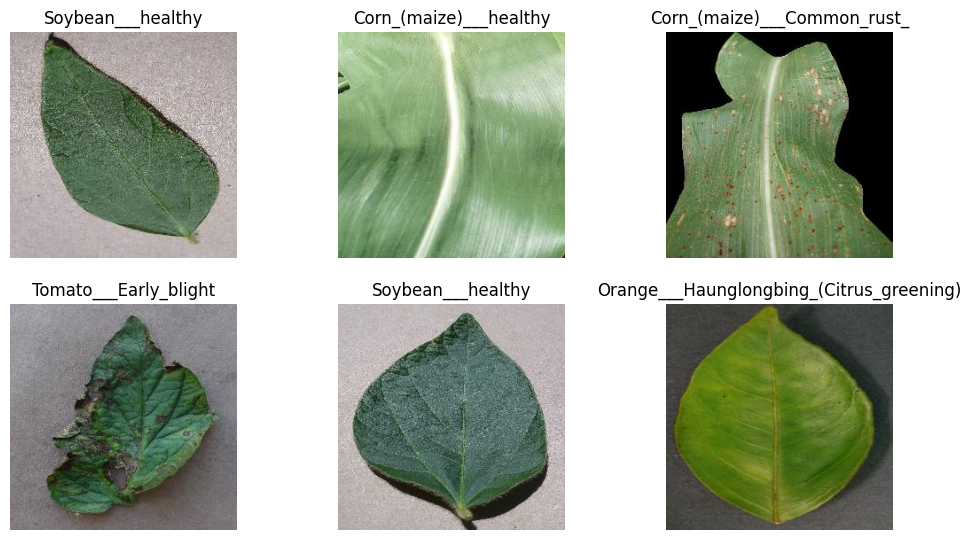

In [12]:


plt.figure(figsize=(12, 10))
for images, labels in train_ds.take(1):
  for i in range(6):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [13]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 256, 256, 3)
(32,)


# Peprocessing & Data Augmentation

In [14]:
preprocess_layer = tf.keras.Sequential([
    layers.Rescaling(1./255),
    layers.Resizing(224,224)
   ])

In [15]:
normalized_ds = train_ds.map(lambda x, y: (preprocess_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.022629537 0.786941


In [16]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
])

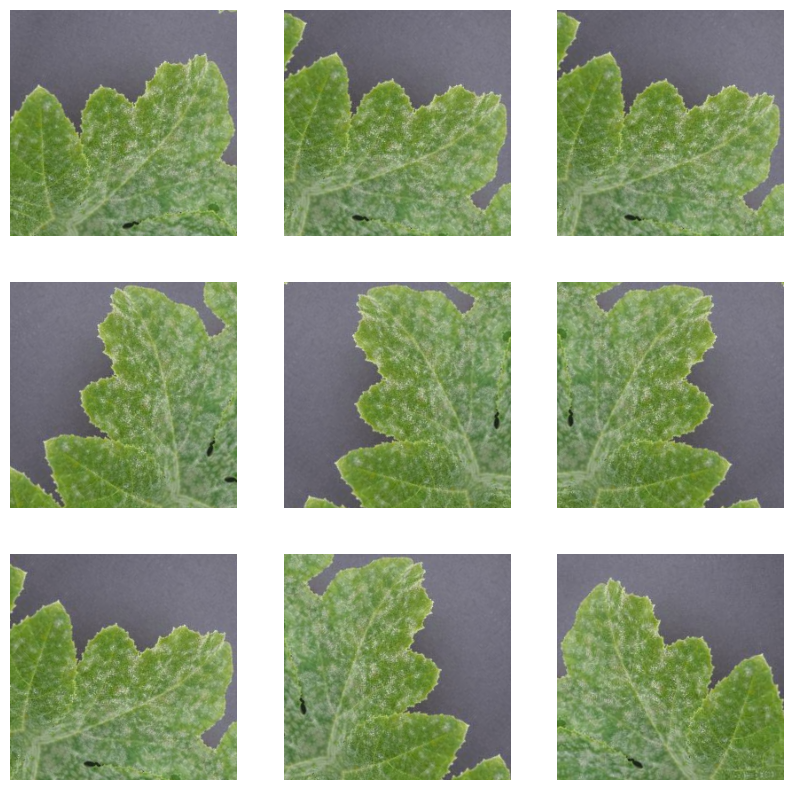

In [17]:
for image, _ in train_ds.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

# Transfer Learning ResNet50

## Feature Extraction

In [ ]:
resnet_model= tf.keras.applications.ResNet50V2(include_top=False,
                   input_shape=(224,224,3),
                   weights='imagenet',
                   )

resnet_model.trainable = False

resnet_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                         

In [ ]:
inputs = layers.Input(shape=(256, 256, 3))
x = preprocess_layer(inputs)
x=data_augmentation(x)

x = resnet_model(x, training=False)
# Average pooling and output layer
x = layers.GlobalAveragePooling2D()(x)
# x=layers.Flatten()(x)
# x = layers.Dense(128, activation='relu')(x)
# x = layers.Dropout(0.2)(x)

# x=layers.GlobalAveragePooling2D()(x)
# x=layers.BatchNormalization()(x)
# x=layers.Dense(512, activation='relu')(x)
# x=layers.BatchNormalization()(x)
# x=layers.Dense(256, activation='relu')(x)
# x=layers.BatchNormalization()(x)
# x=layers.Dense(128, activation='relu')(x)
# x=layers.Dropout(0.3)(x)
# x=layers.BatchNormalization()(x)
# x=layers.Dense(64, activation='relu')(x)
# x=layers.Dropout(0.3)(x)
# x=layers.BatchNormalization()(x)
outputs = layers.Dense(38, activation='softmax')(x)


tf_model = tf.keras.Model(inputs, outputs)

tf_model.summary()
tf_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 sequential_1 (Sequential)   (None, None, None, 3)     0         
                                                                 
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_5 (Dense)             (None, 38)                77862     
                                                           

In [ ]:
tf_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
tf_history = tf_model.fit(train_ds, epochs=10, validation_data=val_ds)

Epoch 1/10
1358/1358 [==============================] - 159s 114ms/step - loss: 0.5078 - accuracy: 0.8626 - val_loss: 0.2583 - val_accuracy: 0.9212
Epoch 2/10
1358/1358 [==============================] - 150s 111ms/step - loss: 0.2294 - accuracy: 0.9308 - val_loss: 0.2086 - val_accuracy: 0.9343
Epoch 3/10
1358/1358 [==============================] - 149s 109ms/step - loss: 0.1872 - accuracy: 0.9409 - val_loss: 0.1917 - val_accuracy: 0.9387
Epoch 4/10
1358/1358 [==============================] - 148s 109ms/step - loss: 0.1599 - accuracy: 0.9481 - val_loss: 0.1934 - val_accuracy: 0.9361
Epoch 5/10
1358/1358 [==============================] - 153s 112ms/step - loss: 0.1490 - accuracy: 0.9515 - val_loss: 0.1551 - val_accuracy: 0.9514
Epoch 6/10
1358/1358 [==============================] - 149s 109ms/step - loss: 0.1351 - accuracy: 0.9556 - val_loss: 0.1594 - val_accuracy: 0.9496
Epoch 7/10
1358/1358 [==============================] - 149s 109ms/step - loss: 0.1261 - accuracy: 0.9588 - val_

Text(0.5, 1.0, 'Feature Extraction using Resnet50')

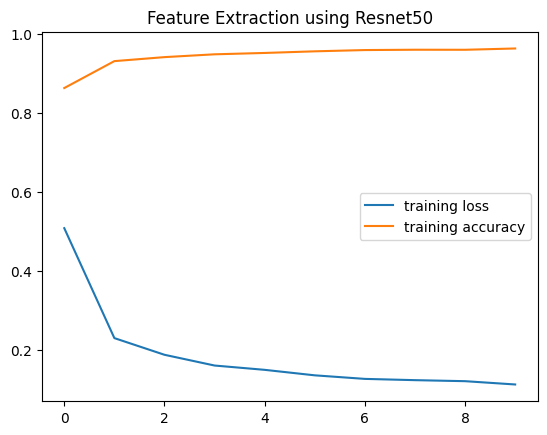

In [ ]:
plt.plot(tf_history.history['loss'], label = 'training loss')
plt.plot(tf_history.history['accuracy'], label = 'training accuracy')
plt.legend()
plt.title('Feature Extraction using Resnet50')

Text(0.5, 1.0, 'Feature Extraction using Resnet50')

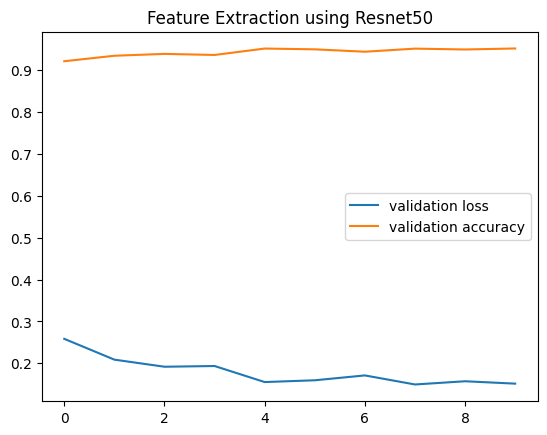

In [ ]:
plt.plot(tf_history.history['val_loss'], label = 'validation loss')
plt.plot(tf_history.history['val_accuracy'], label = 'validation accuracy')
plt.legend()
plt.title('Feature Extraction using Resnet50')

In [34]:
tf_model = tf.keras.models.load_model('/content/resnet50v2FE.h5')  

In [33]:
from sklearn.metrics import precision_score, recall_score
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [35]:
loss, accuracy = tf_model.evaluate(test_ds, verbose=0)
print('Test Accuracy for Resnet50: {:.4f}'.format(accuracy))
y_true = []
y_pred = []
classes = test_ds.class_names

for x, label in test_ds:
    y_true.extend(label.numpy())
    y_pred.extend(tf.math.argmax(tf_model.predict(x,verbose=0), axis=-1).numpy())

precision = precision_score(y_true, y_pred,average='weighted')
recall = recall_score(y_true, y_pred,average='weighted')

print('Precision for Resnet50: {:.4f}'.format(precision))
print('Recall for Resnet50: {:.4f}'.format(recall))

# Calculate and plot the confusion matrix
cm = confusion_matrix(y_true, y_pred)
print('Confusion Matrix for Resnet50:')
print(cm)
# sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=classes, yticklabels=classes)


Test Accuracy for Resnet50: 0.9568
Precision for Resnet50: 0.9598
Recall for Resnet50: 0.9568
Confusion Matrix for Resnet50:
[[ 61   0   0 ...   0   0   0]
 [  0  60   0 ...   0   0   0]
 [  1   0  26 ...   0   0   0]
 ...
 [  0   0   0 ... 525   1   0]
 [  0   0   0 ...   0  37   0]
 [  0   0   0 ...   0   0 152]]


1/1 [==============================] - 0s 35ms/step


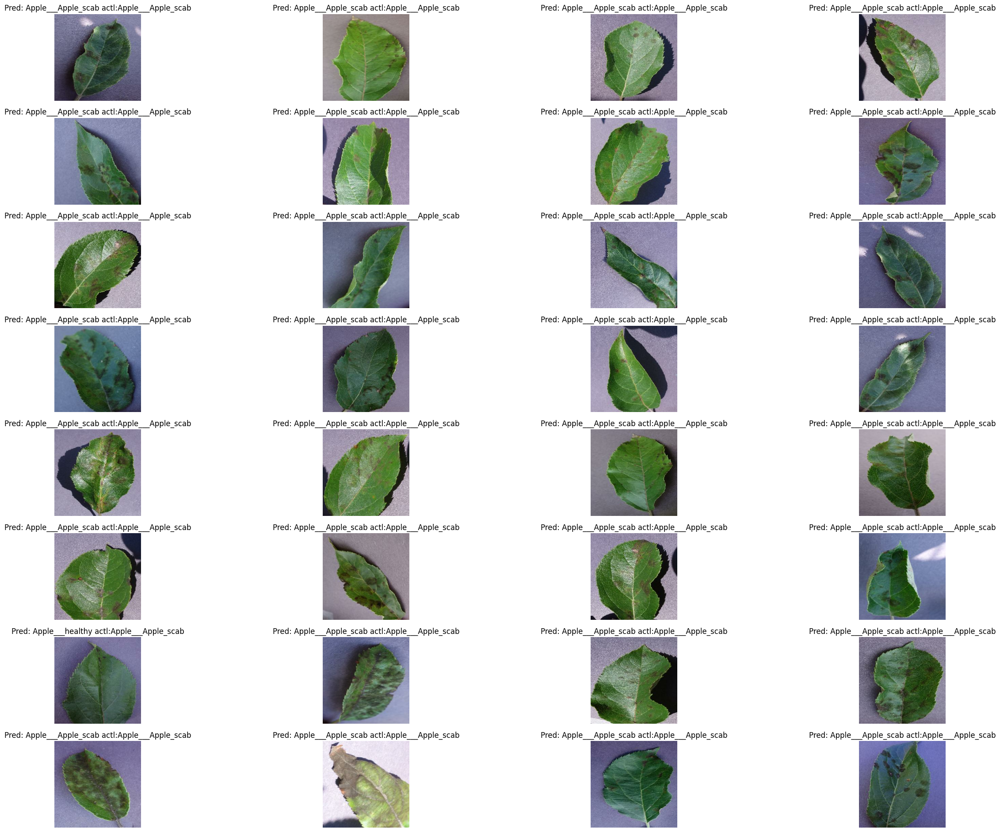

In [41]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in test_ds.take(1):
    predictions = tf_model.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(32):
        ax = plt.subplot(10, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

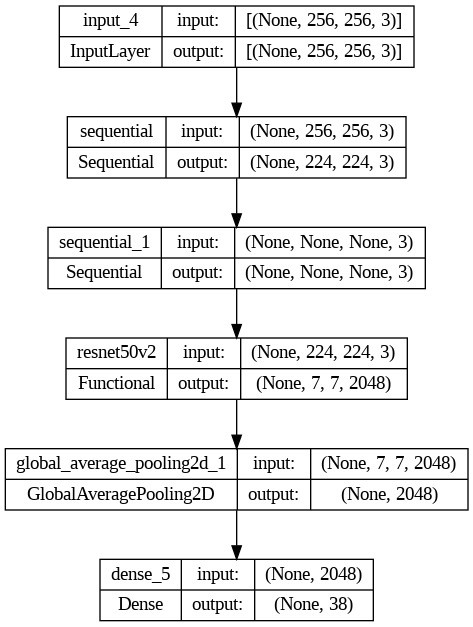

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(tf_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
tf_model.save('resnet50v2.h5')

## Fine Tuning

In [18]:
import tensorflow as tf
from tensorflow.keras import layers
resnet_model= tf.keras.applications.ResNet50V2(include_top=False,
                   input_shape=(224,224,3),
                   weights='imagenet',
                   )

resnet_model.trainable = True

94668760/94668760 [==============================] - 5s 0us/step


In [19]:
# number of layers in the base resnet model
print("Number of layers in the base model: ", len(resnet_model.layers))



Number of layers in the base model:  190


In [20]:
import pandas as pd

layerss = [(layer, layer.name, layer.trainable) for layer in resnet_model.layers]
pd.DataFrame(layerss, columns=['Layer Type', 'Layer Name', 'Layer Trainable'])

,Layer Type,Layer Name,Layer Trainable
0,<keras.engine.input_layer.InputLayer object at...,input_1,True
1,<keras.layers.reshaping.zero_padding2d.ZeroPad...,conv1_pad,True
2,<keras.layers.convolutional.conv2d.Conv2D obje...,conv1_conv,True
3,<keras.layers.reshaping.zero_padding2d.ZeroPad...,pool1_pad,True
4,<keras.layers.pooling.max_pooling2d.MaxPooling...,pool1_pool,True
...,...,...,...
185,<keras.layers.core.activation.Activation objec...,conv5_block3_2_relu,True
186,<keras.layers.convolutional.conv2d.Conv2D obje...,conv5_block3_3_conv,True
187,<keras.layers.merging.add.Add object at 0x7f3b...,conv5_block3_out,True
188,<keras.layers.normalization.batch_normalizatio...,post_bn,True


In [21]:
# Fine-tune from this layer onwards
fine_tune_at = 154 #143

# Freeze all the layers before the `fine_tune_at` layer
for layer in resnet_model.layers[:fine_tune_at]:
  layer.trainable = False

In [22]:
resnet_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                         

In [23]:
inputs = layers.Input(shape=(256, 256, 3))
x = preprocess_layer(inputs)
x=data_augmentation(x)

x = resnet_model(x, training=False)

# Average pooling and output layer
x = layers.GlobalAveragePooling2D()(x)
# x = layers.Flatten()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(38, activation='softmax')(x)


tf2_model = tf.keras.Model(inputs, outputs)

tf2_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 sequential_1 (Sequential)   (None, None, None, 3)     0         
                                                                 
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               1049088   
                                                             

In [24]:
#very low learning rate
tf2_model.compile(optimizer=tf.keras.optimizers.Adam(1e-5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [25]:
loss0, accuracy0 = tf2_model.evaluate(val_ds)

170/170 [==============================] - 28s 96ms/step - loss: 4.1227 - accuracy: 0.0751


In [26]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=6, verbose=1,mode="min", restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_resnet_model.h5', save_best_only=True)

In [27]:
tf2_history = tf2_model.fit(train_ds, epochs=30, validation_data=val_ds, callbacks=[early_stopping, model_checkpoint])

Epoch 1/30
1358/1358 [==============================] - 227s 157ms/step - loss: 0.7712 - accuracy: 0.7869 - val_loss: 0.1952 - val_accuracy: 0.9378
Epoch 2/30
1358/1358 [==============================] - 205s 151ms/step - loss: 0.2083 - accuracy: 0.9348 - val_loss: 0.1272 - val_accuracy: 0.9596
Epoch 3/30
1358/1358 [==============================] - 204s 150ms/step - loss: 0.1373 - accuracy: 0.9547 - val_loss: 0.1079 - val_accuracy: 0.9673
Epoch 4/30
1358/1358 [==============================] - 204s 150ms/step - loss: 0.1021 - accuracy: 0.9663 - val_loss: 0.0896 - val_accuracy: 0.9723
Epoch 5/30
1358/1358 [==============================] - 209s 154ms/step - loss: 0.0832 - accuracy: 0.9711 - val_loss: 0.0875 - val_accuracy: 0.9743
Epoch 6/30
1358/1358 [==============================] - 204s 150ms/step - loss: 0.0674 - accuracy: 0.9771 - val_loss: 0.0799 - val_accuracy: 0.9767
Epoch 7/30
1358/1358 [==============================] - 204s 150ms/step - loss: 0.0560 - accuracy: 0.9808 - val_

Text(0.5, 1.0, 'Resnet50')

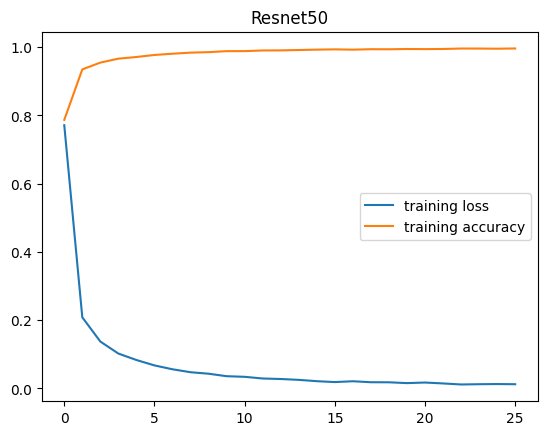

In [28]:
plt.plot(tf2_history.history['loss'], label = 'training loss')
plt.plot(tf2_history.history['accuracy'], label = 'training accuracy')
plt.legend()  
plt.title('Resnet50')    

Text(0.5, 1.0, 'Resnet50')

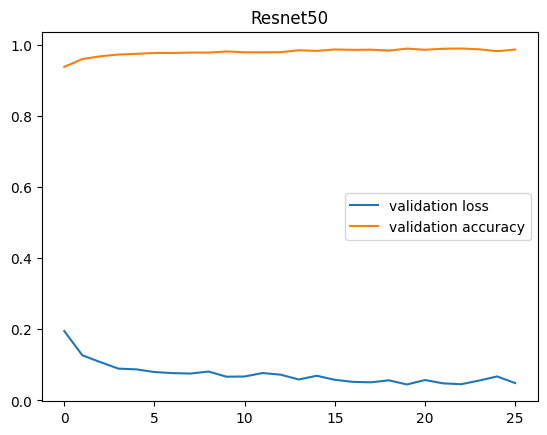

In [29]:
plt.plot(tf2_history.history['val_loss'], label = 'validation loss')
plt.plot(tf2_history.history['val_accuracy'], label = 'validation accuracy')
plt.legend()
plt.title('Resnet50')

In [30]:
from sklearn.metrics import precision_score, recall_score
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [31]:
loss, accuracy = tf2_model.evaluate(test_ds, verbose=0)
print('Test Accuracy for Resnet50: {:.4f}'.format(accuracy))
y_true = []
y_pred = []
classes = test_ds.class_names

for x, label in test_ds:
    y_true.extend(label.numpy())
    y_pred.extend(tf.math.argmax(tf2_model.predict(x,verbose=0), axis=-1).numpy())

precision = precision_score(y_true, y_pred,average='weighted')
recall = recall_score(y_true, y_pred,average='weighted')

print('Precision for Resnet50: {:.4f}'.format(precision))
print('Recall for Resnet50: {:.4f}'.format(recall))

# Calculate and plot the confusion matrix
cm = confusion_matrix(y_true, y_pred)
print('Confusion Matrix for Resnet50:')
print(cm)
# sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=classes, yticklabels=classes)


Test Accuracy for Resnet50: 0.9872
Precision for Resnet50: 0.9878
Recall for Resnet50: 0.9872
Confusion Matrix for Resnet50:
[[ 58   1   0 ...   0   0   1]
 [  0  63   0 ...   0   0   0]
 [  0   0  28 ...   0   0   0]
 ...
 [  0   0   0 ... 532   0   0]
 [  0   0   0 ...   0  36   0]
 [  0   0   0 ...   0   0 160]]


1/1 [==============================] - 0s 34ms/step


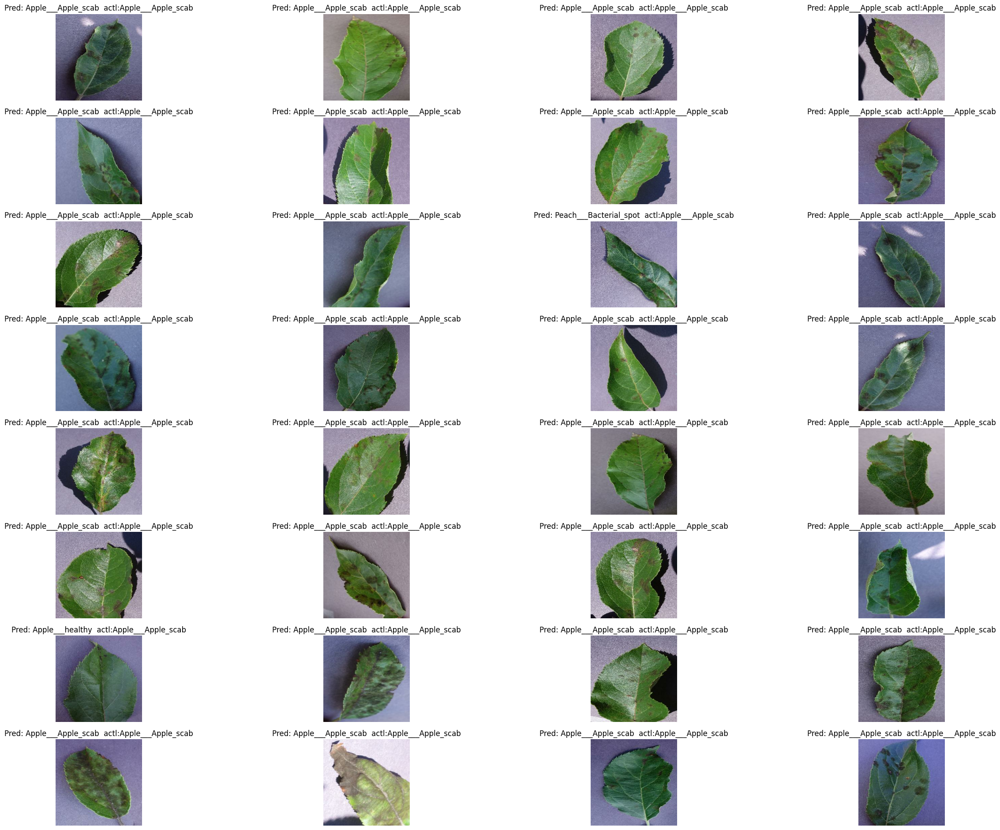

In [32]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in test_ds.take(1):
    predictions = tf2_model.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(32):
        ax = plt.subplot(10, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+'  actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

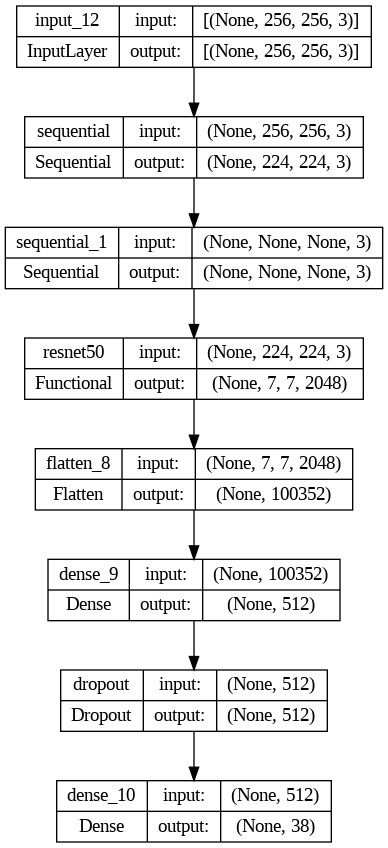

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(tf2_model, to_file='model_plot2.png', show_shapes=True, show_layer_names=True)

In [ ]:
tf2_model.save('resnet50_ft.h5')

# InceptionV3

In [ ]:
inception = tf.keras.applications.InceptionV3(input_shape=(224,224,3), weights='imagenet', include_top=False)

for layer in inception.layers:
    layer.trainable = False
print(len(inception.layers))

87910968/87910968 [==============================] - 1s 0us/step
311


In [ ]:
inputs = layers.Input(shape=(256, 256, 3))
x = preprocess_layer(inputs)
x=data_augmentation(x)

x = inception(x, training=False)

# Average pooling and output layer
x = layers.GlobalAveragePooling2D()(x)
outputs = layers.Dense(38, activation='softmax')(x)

inception_model = tf.keras.Model(inputs, outputs)


In [ ]:
inception_model.summary()
inception_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential_2 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 sequential_3 (Sequential)   (None, None, None, 3)     0         
                                                                 
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 global_average_pooling2d_3   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_4 (Dense)             (None, 38)                77862     
                                                           

In [ ]:
inception_history = inception_model.fit(train_ds, epochs=10, validation_data=val_ds)

Epoch 1/10
1358/1358 [==============================] - 138s 95ms/step - loss: 0.6922 - accuracy: 0.8043 - val_loss: 0.4542 - val_accuracy: 0.8579
Epoch 2/10
1358/1358 [==============================] - 118s 87ms/step - loss: 0.3852 - accuracy: 0.8787 - val_loss: 0.3599 - val_accuracy: 0.8819
Epoch 3/10
1358/1358 [==============================] - 118s 86ms/step - loss: 0.3267 - accuracy: 0.8954 - val_loss: 0.3063 - val_accuracy: 0.8994
Epoch 4/10
1358/1358 [==============================] - 117s 86ms/step - loss: 0.3037 - accuracy: 0.9018 - val_loss: 0.2957 - val_accuracy: 0.9001
Epoch 5/10
1358/1358 [==============================] - 117s 86ms/step - loss: 0.2865 - accuracy: 0.9065 - val_loss: 0.3049 - val_accuracy: 0.8963
Epoch 6/10
1358/1358 [==============================] - 118s 86ms/step - loss: 0.2691 - accuracy: 0.9119 - val_loss: 0.2898 - val_accuracy: 0.9055
Epoch 7/10
1358/1358 [==============================] - 117s 86ms/step - loss: 0.2642 - accuracy: 0.9145 - val_loss: 0

Text(0.5, 1.0, 'InceptionV3')

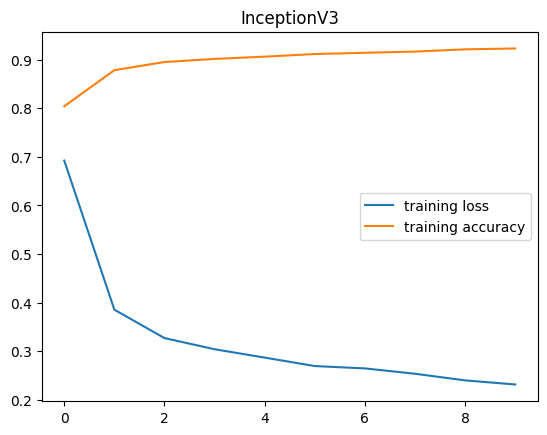

In [ ]:
plt.plot(inception_history.history['loss'], label = 'training loss')
plt.plot(inception_history.history['accuracy'], label = 'training accuracy')
plt.legend()
plt.title('InceptionV3')

Text(0.5, 1.0, 'InceptionV3')

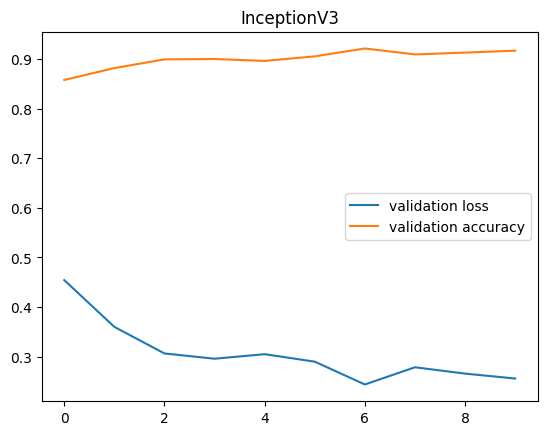

In [ ]:
plt.plot(inception_history.history['val_loss'], label = 'validation loss')
plt.plot(inception_history.history['val_accuracy'], label = 'validation accuracy')
plt.legend()
plt.title('InceptionV3')

In [ ]:
inception_model = tf.keras.models.load_model('InceptionV3.h5')

In [ ]:
from sklearn.metrics import precision_score, recall_score
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [ ]:
loss, accuracy = inception_model.evaluate(test_ds, verbose=0)
print('Test Accuracy for InceptionV3: {:.4f}'.format(accuracy))
y_true = []
y_pred = []
classes = test_ds.class_names

for x, label in test_ds:
    y_true.extend(label.numpy())
    y_pred.extend(tf.math.argmax(inception_model.predict(x,verbose=0), axis=-1).numpy())

precision = precision_score(y_true, y_pred,average='weighted')
recall = recall_score(y_true, y_pred,average='weighted')

print('Precision for InceptionV3: {:.4f}'.format(precision))
print('Recall for InceptionV3: {:.4f}'.format(recall))

# Calculate and plot the confusion matrix
cm = confusion_matrix(y_true, y_pred)
print('Confusion Matrix for InceptionV3:')
print(cm)
# sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=classes, yticklabels=classes)


Test Accuracy for InceptionV3: 0.9168
Precision for InceptionV3: 0.9195
Recall for InceptionV3: 0.9168
Confusion Matrix for InceptionV3:
[[ 53   0   0 ...   0   0   3]
 [  1  58   1 ...   0   0   0]
 [  1   0  26 ...   0   0   0]
 ...
 [  0   0   0 ... 521   0   0]
 [  0   0   0 ...   1  28   0]
 [  0   0   0 ...   0   0 148]]


1/1 [==============================] - 0s 40ms/step


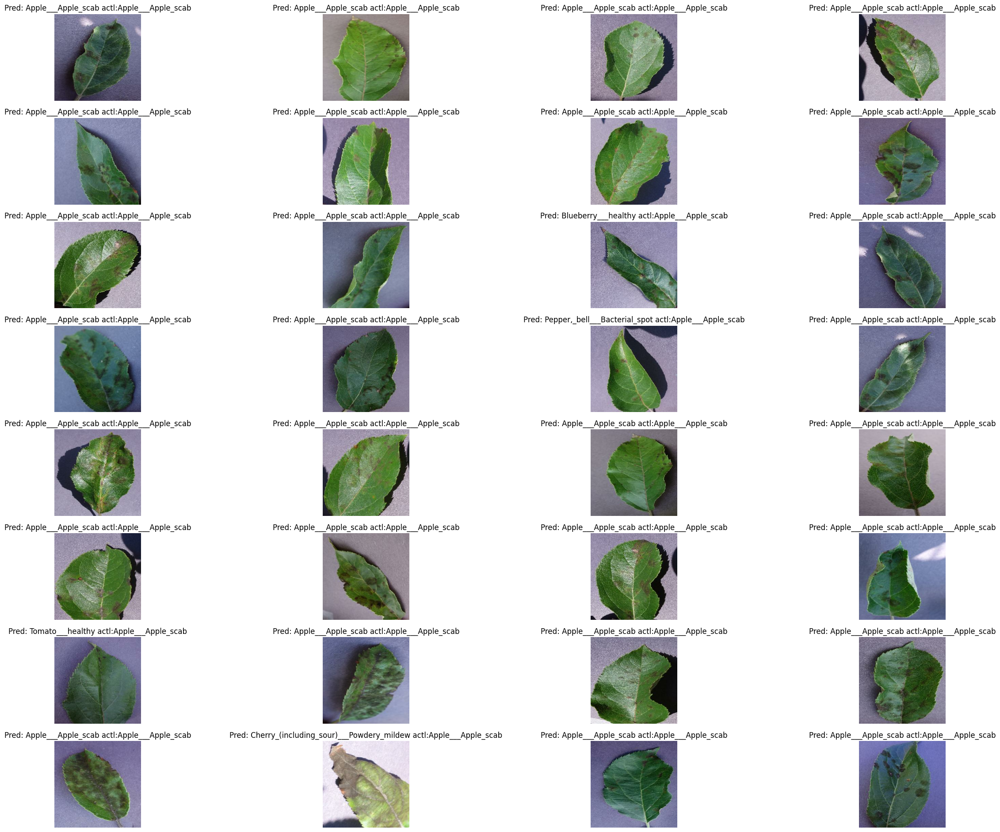

In [ ]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in test_ds.take(1):
    predictions = inception_model.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(32):
        ax = plt.subplot(10, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

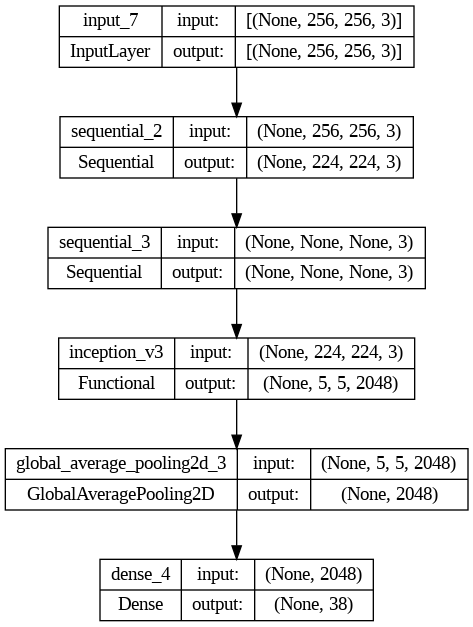

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(inception_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
inception_model.save('InceptionV3.h5')

# VGG16

In [ ]:
# define cnn model
from keras.applications.vgg16 import VGG16
from keras.models import Model
# load model
vgg = VGG16(include_top=False, input_shape=(224, 224, 3))
# mark loaded layers as not trainable
for layer in vgg.layers:
    layer.trainable = False


58889256/58889256 [==============================] - 1s 0us/step


In [ ]:
inputs = layers.Input(shape=(256, 256, 3))
x = preprocess_layer(inputs)
x=data_augmentation(x)

x = vgg(x, training=False)

# add new classifier layers

x = layers.Flatten()(x)
x = layers.Dense(128, activation='relu')(x)
outputs = layers.Dense(38, activation='softmax')(x)

# define new model
vgg_model= Model(inputs, outputs)
vgg_model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential_2 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 sequential_3 (Sequential)   (None, None, None, 3)     0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense_5 (Dense)             (None, 128)               3211392   
                                                                 
 dense_6 (Dense)             (None, 38)                4902

In [ ]:
vgg_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
vgg_history = vgg_model.fit(train_ds, epochs=5, validation_data=val_ds)

Epoch 1/5
1358/1358 [==============================] - 215s 153ms/step - loss: 0.7775 - accuracy: 0.7751 - val_loss: 0.4328 - val_accuracy: 0.8547
Epoch 2/5
1358/1358 [==============================] - 205s 151ms/step - loss: 0.3609 - accuracy: 0.8820 - val_loss: 0.2801 - val_accuracy: 0.9051
Epoch 3/5
1358/1358 [==============================] - 205s 151ms/step - loss: 0.3057 - accuracy: 0.8979 - val_loss: 0.2830 - val_accuracy: 0.9023
Epoch 4/5
1358/1358 [==============================] - 205s 151ms/step - loss: 0.2673 - accuracy: 0.9089 - val_loss: 0.2351 - val_accuracy: 0.9212
Epoch 5/5
1358/1358 [==============================] - 205s 151ms/step - loss: 0.2478 - accuracy: 0.9168 - val_loss: 0.2614 - val_accuracy: 0.9132


In [ ]:
# vgg_history = vgg_model.fit(train_ds, epochs=1, validation_data=val_ds)

In [ ]:
# loss4, accuracy4 = vgg_model.evaluate(val_ds)
# print('Test accuracy for InceptionV3 :', accuracy4)

Text(0.5, 1.0, 'VGG16')

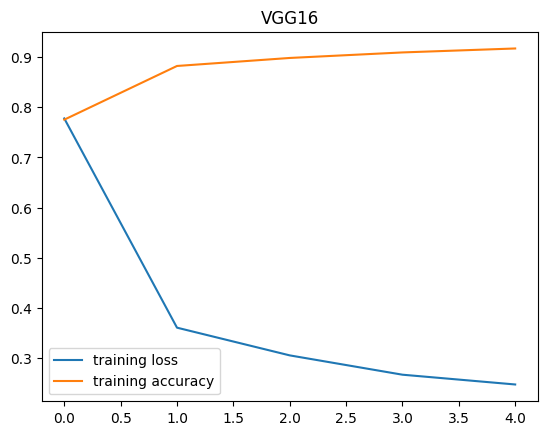

In [ ]:
plt.plot(vgg_history.history['loss'], label = 'training loss')
plt.plot(vgg_history.history['accuracy'], label = 'training accuracy')
plt.legend()
plt.title('VGG16')

Text(0.5, 1.0, 'VGG16')

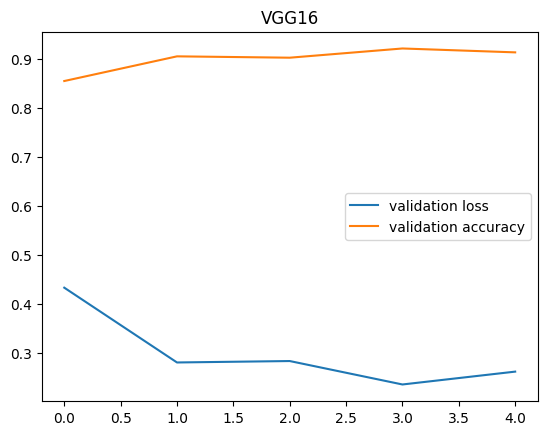

In [ ]:
plt.plot(vgg_history.history['val_loss'], label = 'validation loss')
plt.plot(vgg_history.history['val_accuracy'], label = 'validation accuracy')
plt.legend()
plt.title('VGG16')

In [ ]:
from sklearn.metrics import precision_score, recall_score
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [ ]:
loss, accuracy = vgg_model.evaluate(test_ds, verbose=0)
print('Test Accuracy for Vgg16: {:.4f}'.format(accuracy))
y_true = []
y_pred = []
classes = test_ds.class_names

for x, label in test_ds:
    y_true.extend(label.numpy())
    y_pred.extend(tf.math.argmax(vgg_model.predict(x,verbose=0), axis=-1).numpy())

precision = precision_score(y_true, y_pred,average='weighted')
recall = recall_score(y_true, y_pred,average='weighted')

print('Precision for Vgg16: {:.4f}'.format(precision))
print('Recall for Vgg16: {:.4f}'.format(recall))

# Calculate and plot the confusion matrix
cm = confusion_matrix(y_true, y_pred)
print('Confusion Matrix for Vgg16:')
print(cm)
# sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=classes, yticklabels=classes)


Test Accuracy for Vgg16: 0.9033
Precision for Vgg16: 0.9149
Recall for Vgg16: 0.9033
Confusion Matrix for Vgg16:
[[ 59   0   0 ...   0   0   0]
 [  1  53   0 ...   0   0   0]
 [  4   0  16 ...   0   0   0]
 ...
 [  0   0   0 ... 460   0   1]
 [  0   0   0 ...   0  21   1]
 [  0   0   0 ...   0   0 155]]


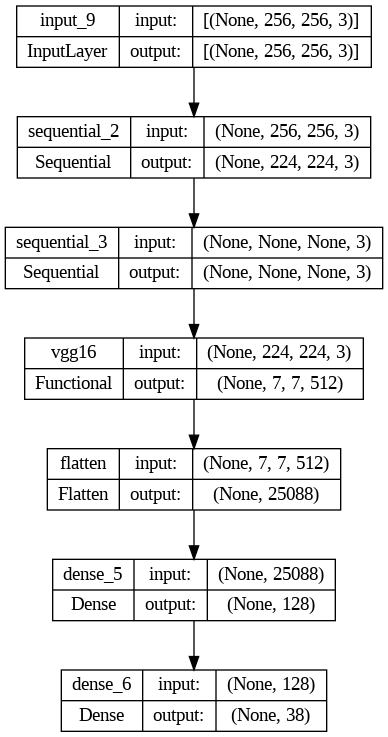

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(vgg_model, to_file='model_plot4.png', show_shapes=True, show_layer_names=True)

In [ ]:
vgg_model.save('vgg_.h5')

# Normal CNN

In [ ]:
## Defining Cnn
MyCnn = tf.keras.models.Sequential([
  layers.BatchNormalization(),
  layers.Conv2D(32 , 3, activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(256, activation='relu'),
  layers.Dense(len(class_names), activation= 'softmax')
])


In [ ]:
MyCnn.compile(optimizer='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
## lets train our CNN
retVal = MyCnn.fit(train_ds,validation_data= val_ds,epochs = 8)

Epoch 1/8
1358/1358 [==============================] - 115s 81ms/step - loss: 0.9140 - accuracy: 0.7400 - val_loss: 0.5260 - val_accuracy: 0.8359
Epoch 2/8
1358/1358 [==============================] - 108s 80ms/step - loss: 0.3742 - accuracy: 0.8834 - val_loss: 0.3832 - val_accuracy: 0.8813
Epoch 3/8
1358/1358 [==============================] - 107s 78ms/step - loss: 0.1933 - accuracy: 0.9388 - val_loss: 0.2918 - val_accuracy: 0.9134
Epoch 4/8
1358/1358 [==============================] - 108s 79ms/step - loss: 0.1204 - accuracy: 0.9603 - val_loss: 0.4578 - val_accuracy: 0.8867
Epoch 5/8
1358/1358 [==============================] - 108s 80ms/step - loss: 0.0945 - accuracy: 0.9710 - val_loss: 0.4769 - val_accuracy: 0.8916
Epoch 6/8
1358/1358 [==============================] - 109s 80ms/step - loss: 0.0777 - accuracy: 0.9760 - val_loss: 0.4804 - val_accuracy: 0.8974
Epoch 7/8
1358/1358 [==============================] - 109s 80ms/step - loss: 0.0649 - accuracy: 0.9802 - val_loss: 0.4924 -

Text(0.5, 1.0, 'MyCNN')

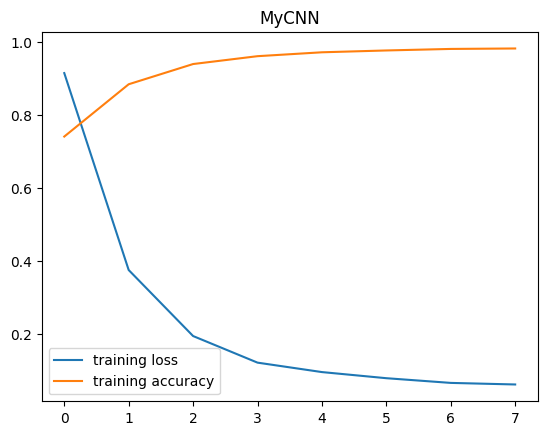

In [ ]:
plt.plot(retVal.history['loss'], label = 'training loss')
plt.plot(retVal.history['accuracy'], label = 'training accuracy')
plt.legend()
plt.title('MyCNN')

Text(0.5, 1.0, 'MyCNN')

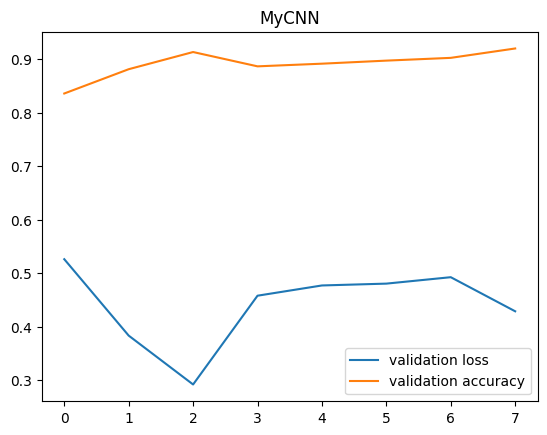

In [ ]:
plt.plot(retVal.history['val_loss'], label = 'validation loss')
plt.plot(retVal.history['val_accuracy'], label = 'validation accuracy')
plt.legend()
plt.title('MyCNN')

In [ ]:
from sklearn.metrics import precision_score, recall_score
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [ ]:
loss, accuracy = MyCnn.evaluate(test_ds, verbose=0)
print('Test Accuracy for MyCNN: {:.4f}'.format(accuracy))
y_true = []
y_pred = []
classes = test_ds.class_names

for x, label in test_ds:
    y_true.extend(label.numpy())
    y_pred.extend(tf.math.argmax(MyCnn.predict(x,verbose=0), axis=-1).numpy())

precision = precision_score(y_true, y_pred,average='weighted')
recall = recall_score(y_true, y_pred,average='weighted')

print('Precision for MyCNN: {:.4f}'.format(precision))
print('Recall for MyCNN: {:.4f}'.format(recall))

# Calculate and plot the confusion matrix
cm = confusion_matrix(y_true, y_pred)
print('Confusion Matrix for MyCNN:')
print(cm)
# sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=classes, yticklabels=classes)


Test Accuracy for MyCNN: 0.9176
Precision for MyCNN: 0.9193
Recall for MyCNN: 0.9176
Confusion Matrix for MyCNN:
[[ 48   5   0 ...   0   0   0]
 [  0  59   0 ...   0   0   0]
 [  0   0  26 ...   0   0   0]
 ...
 [  0   0   0 ... 531   0   0]
 [  0   0   0 ...   0  37   0]
 [  0   0   0 ...   0   0 160]]


1/1 [==============================] - 0s 31ms/step


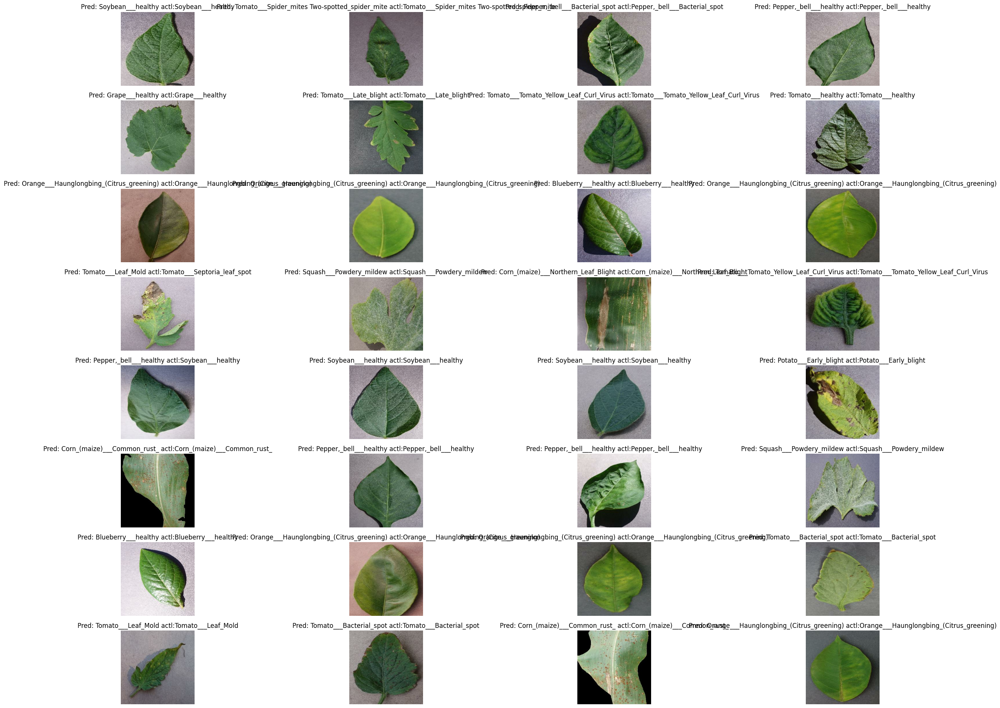

In [ ]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in val_ds.take(1):
    predictions = MyCnn.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(32):
        ax = plt.subplot(10, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

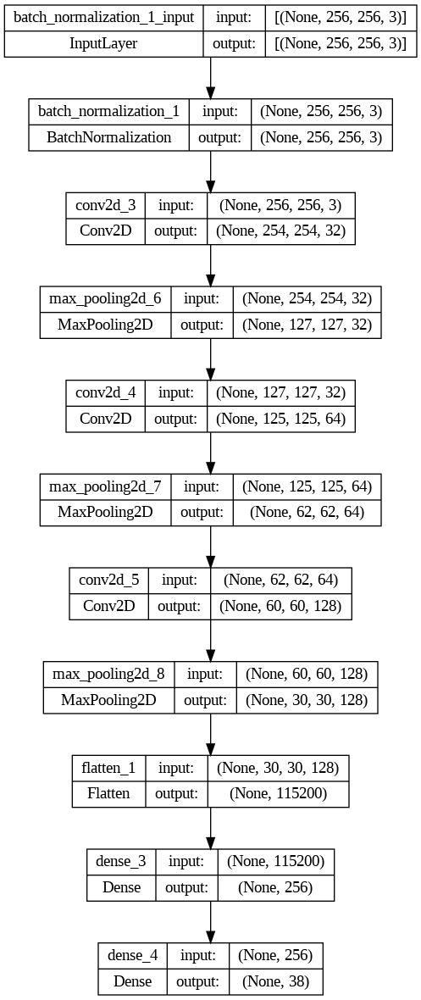

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(MyCnn, to_file='model_plot5.png', show_shapes=True, show_layer_names=True)

In [ ]:
MyCnn.save('MyCNNmodel.h5')